<h1>
<center>
Assignment 2: Classification and locally weighted regression
</center>
</h1>
<center>
CS 4262/5262 - Foundations of Machine Learning<br>
Vanderbilt University, Spring 2023<br>
Due: Check Brightspace
</center>
<hr>
<br>This assignment will focus on logistic regression (for binary classification) and locally weighted linear regression. For each algorithm, we have provided a class framework as a suggestion, but you are not required to use those in your implementation. Please use good programming practices - include informative comments and vectorize operations whenever possible. In addition to programming tasks, there are short-answer questions throughout the notebook. 

Contact: Quan Liu quan.liu@vanderbilt.edu for any clarifying questions.

### Please enter your name:  Claire Cross
---

In [1]:
import csv
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import numpy as np
import scipy as sp
from sklearn import datasets
import random

--- 
## Part 0: Data


You will be applying binary classification to two different datasets: the [Iris](https://scikit-learn.org/stable/datasets/toy_dataset.html#iris-plants-dataset) dataset and the wine quality dataset (Data Source :https://archive.ics.uci.edu/ml/datasets/Wine+Quality). The Iris dataset is smaller and simpler, and therefore may be useful for debugging. This dataset consists of measurements (septal and petal length and width) of 50 samples from each of 3 species of Iris flower. The wine quality dataset is more complex, and the classification task is to predict whether a sample should be red wine or white wine given the feature.

**Task 1**
- Load the Iris dataset from scikit-learn. (refer to [link](https://scikit-learn.org/stable/modules/generated/sklearn.datasets.load_iris.html))
- Here, we will represent each sample by 2 of the 4 available features: petal width and petal length. 
- Display a scatterplot of the data, such that: 
    * the x- and y- axes correspond to the two features (petal width, petal length)
    * the axes are labelled 
    * points are colored according to class membership
    * the legend describes which iris type (class) is represented by each color

**Question 1:  Which classes appear to be linearly separable in this feature space?**

Response: The setosa species is linearly separable from each of the other two classes. However, there is some overlap between the versicolor and virginica species, so these two classes are not linearly separable.

In [2]:
#TODO - Iris dataset
iris = datasets.load_iris() #load dataset

#take a look at the dataset description
print(iris.DESCR)

.. _iris_dataset:

Iris plants dataset
--------------------

**Data Set Characteristics:**

    :Number of Instances: 150 (50 in each of three classes)
    :Number of Attributes: 4 numeric, predictive attributes and the class
    :Attribute Information:
        - sepal length in cm
        - sepal width in cm
        - petal length in cm
        - petal width in cm
        - class:
                - Iris-Setosa
                - Iris-Versicolour
                - Iris-Virginica
                
    :Summary Statistics:

    ============== ==== ==== ======= ===== ====================
                    Min  Max   Mean    SD   Class Correlation
    ============== ==== ==== ======= ===== ====================
    sepal length:   4.3  7.9   5.84   0.83    0.7826
    sepal width:    2.0  4.4   3.05   0.43   -0.4194
    petal length:   1.0  6.9   3.76   1.76    0.9490  (high!)
    petal width:    0.1  2.5   1.20   0.76    0.9565  (high!)
    ============== ==== ==== ======= ===== ===========

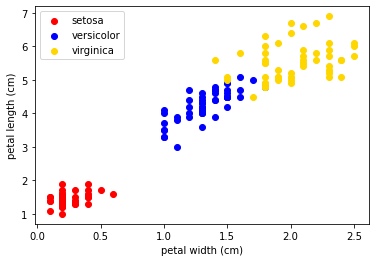

In [3]:
#assign a color to each target value
target_color = zip(range(len(iris.target_names)), ['red', 'blue', 'gold'])

#plot data
for target, color in target_color: #loop through species, plotting one at a time to enabe legend generation
    plt.scatter(iris.data[iris.target==target, 3], #petal width
                iris.data[iris.target==target, 2], #petal length
                label=iris.target_names[target],
                color=color)
plt.xlabel(iris.feature_names[3])
plt.ylabel(iris.feature_names[2])
plt.legend()
plt.show()

**Task 2**
- Load the wine dataset given in the brightspace.
    * we have 1600 lines of white wine data and 1599 lines of red wine data
    * white/red wine is labeled as 0/1
    * each sample has 11 dimensions of features with the same order as [fixed acidity, volatile acidity, citric acid, residual sugar, chlorides, free sulfur dioxide, total sulfur dioxide, density, pH, sulphates, alcohol] and one dimension of label
- Here, we will represent each sample by 3 features (using mpl_toolkits.mplot3d.Axes3D): 
- Similar to the Iris dataset, display a scatterplot of the data such that: "volatile acidity", "fixed acidity", and "residual sugar".
    * the x-, y-, and z- axes correspond to the features
    * the axes are labelled 
    * the sample point is colored based on the class
    * the legend specifies the label associated with each color

In [4]:
#TODO - wine quality dataset
%matplotlib notebook
from mpl_toolkits.mplot3d import Axes3D

#open wine data file
wine_file = open('assignment2-wine_quality.csv','r') 
wine_csv_data = csv.reader(wine_file)
wine_data = np.asarray([wine_data for wine_data in wine_csv_data]) #extract data 
wine_file.close() #close file

#get feature labels and order
for i, label in enumerate(wine_data[0]):
    print(i, label)

0 fixed acidity
1 volatile acidity
2 citric acid
3 residual sugar
4 chlorides
5 free sulfur dioxide
6 total sulfur dioxide
7 density
8 pH
9 sulphates
10 alcohol
11 label


<IPython.core.display.Javascript object>


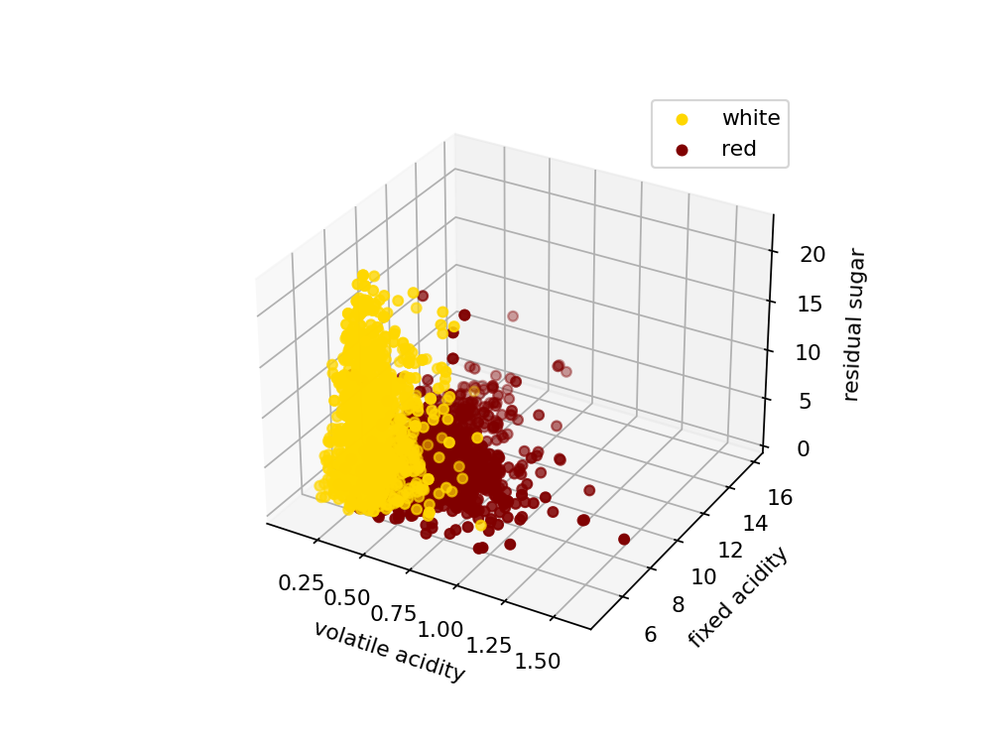

In [5]:
#assign a color to each target value
target_color = zip(np.unique(wine_data[1:,11]), ['gold', 'maroon'])
wine_types = ['white', 'red']

#3D plot
fig = plt.figure()
ax = fig.add_subplot(projection='3d')
for target, color in target_color: #loop through each type of wine, plotting each in a different color
    x = wine_data[wine_data[:,11]==target, 1].astype(float) #volatile acidity
    y = wine_data[wine_data[:,11]==target, 0].astype(float) #fixed acidity
    z = wine_data[wine_data[:,11]==target, 3].astype(float) #residual sugar
    ax.scatter(x, y, z, c=color, label=wine_types[int(float(target))])

ax.set_xlabel('volatile acidity')
ax.set_ylabel('fixed acidity')
ax.set_zlabel('residual sugar')
ax.legend()
plt.show()

**Task 3**

There are many dimensions of the features, use `sns.PairGrid()` to plot out the pairwise feature relationship on both iris and wine dataset. 

<IPython.core.display.Javascript object>


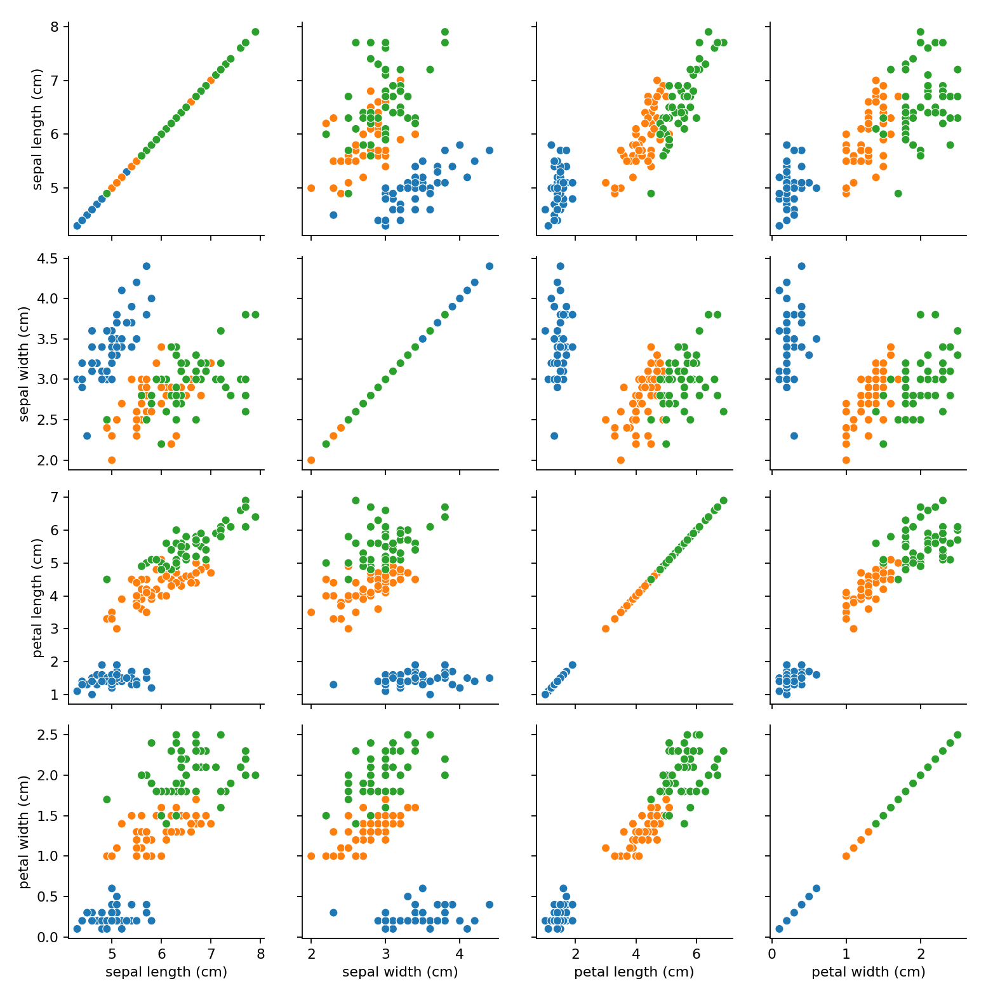

In [6]:
#TODO pairwise plot on 2 dataset
import seaborn as sns
import pandas as pd

#convert iris dataset to dataframe
iris_df = pd.DataFrame(iris.data, columns=iris.feature_names)
iris_df['species'] = iris.target #add target column for plotting purposes
for i, name in enumerate(iris_df['species']): #rename target to species names
    iris_df.at[i, 'species'] = iris.target_names[name]

#pairwise plot on iris dataset
iris_grid = sns.PairGrid(iris_df, hue='species')
iris_grid.map(sns.scatterplot)

<IPython.core.display.Javascript object>


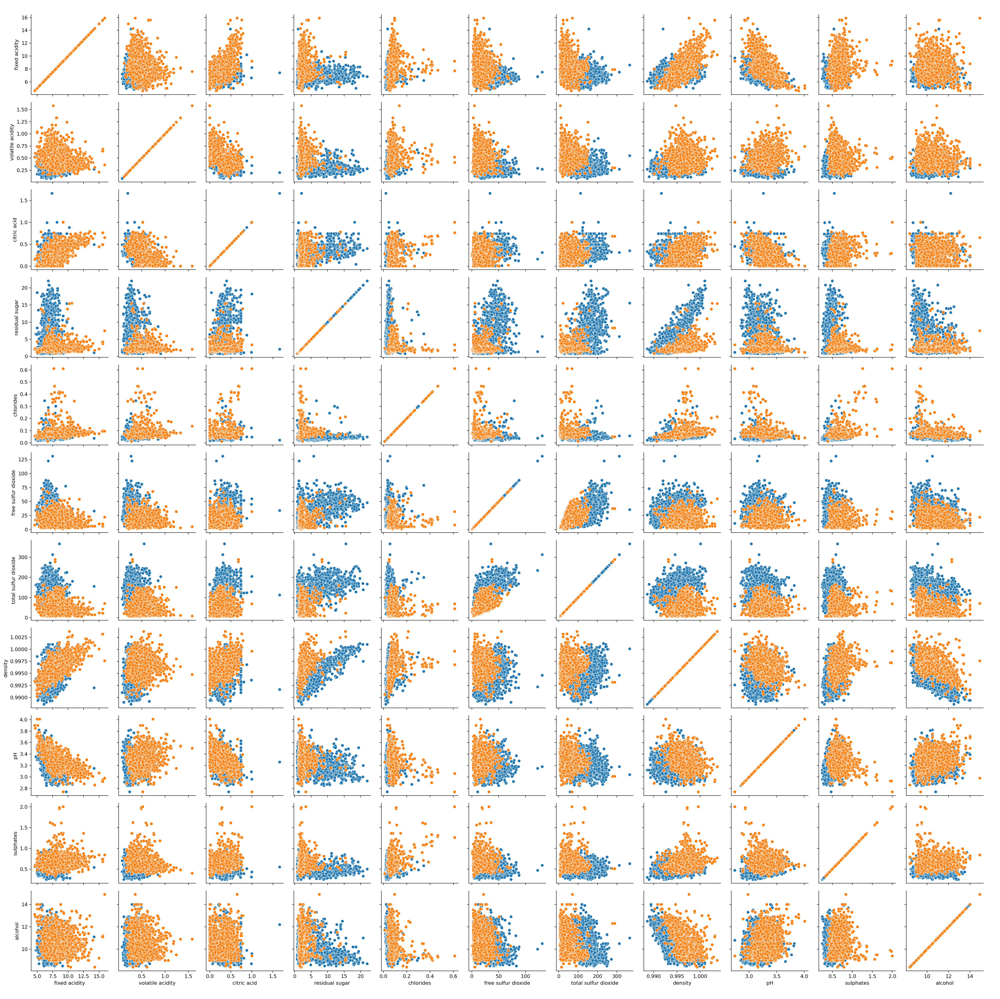

In [7]:
#convert wine dataset to dataframe
wine_df = pd.DataFrame(wine_data[1:,:], columns=wine_data[0,:]).astype(float)

#pairwise plot on iris dataset
wine_grid = sns.PairGrid(wine_df, hue='label')
wine_grid.map(sns.scatterplot)

**Question 2:**

 2.1 Comment on the plots from the wine dataset, compared to the kinds of plots you saw in the Iris dataset. What similarities or differences do you see? What does the PairGrid visualization help to do?

Response: There seems to be less correlation between features in the wine dataset(with the exception of total and free sulfure dioxide). There is also more variance within each class, meaning that two wines in the same class can exhibit very different values for most features, and there is a lot of overlap between the two classes. The PairGrid visualization allows us to understand the relationships between each feature. It allows us to get a sense of the distributions of each feature and how one feature may correlate with another.

 2.2 Discuss separability of the wine dataset, based on what you have seen so far. Is it separable in two features? Do you think multiple features would change this outcome?

Response: The wine dataset is not separable in two features. I think that multiple features would improve the accuracy of a logistic regression model, but since there is some class overlap in every feature pair I am doubtful that we will get a 100% accurate model.

---
## Part 1: Logistic Regression

The first classification algorithm you will implement is Logistic Regression (for binary classification). You do not have to use the class framework provided below, but please make sure to organize and comment your code clearly. 

**Task 4**
Write a LogisticRegression class such that:
 - parameters ($\theta$) are optimized using gradient descent 
 - there is an `evaluate` method that returns the model's accuracy on a given set of data
 - there is a `learning curve` method that plots the cost function against the number of iterations
 - there is a `decision boundary` method that renders a plot of the training data with the decision boundary overlayed (note: this code is provided for you below - make sure you understand how it works) 
 - please vectorize operations as much as possible

In [8]:
#TODO - implement LogisticRegression class

class LogisticRegression():
    
    '''
    Implementation of logistic regression using gradient descent
    @param X (numpy.ndarray) - design matrix of input features
           y (numpy.ndarray) - corresponding targets
           theta (numpy.ndarray) - model parameters (variable coefficients, in order of increasing variable degree)
           alpha (float) - learning step size
    '''
    def __init__(self, X, y, theta, alpha):
        self.X = X
        self.y = y
        self.theta = theta 
        self.alpha = alpha
    
    '''
    Hypothesis - returns p(y=1|x) on inputs contained in the design matrix X 
    @param X_i (numpy.ndarray) - input features from the design matrix (np.ndarray)
    @return corresponding model output (np.ndarray)
    '''
    def sigmoid(self, X_i): 
        return 1/(1+np.exp(-(self.theta.dot(X_i))))
     
    '''
    Predictions - return predictions of class membership (0,1) of the datapoints in the design matrix X
    @param X (numpy.ndarray) - design matrix of input features
    @return corresponding predictions (np.ndarray)
    '''
    def predict(self, X):
        preds = []
        for i in range(len(X)): #loop through each row in the design matrix
            g = self.sigmoid(X[i,:]) #calculate h(x)
            #assign test point to class 0 or 1
            if g<0.5:
                preds.append(0)
            else:
                preds.append(1)
        return np.array(preds)
    
    '''
    Cost function measuring mean squared error of the regression line for a given training set and model parameters.
    @return MSE based on the current parameters (float)
    '''
    def cost(self):
        sum_log = 0
        for i in range(len(self.X)): #sum of the cost function prior to data length normalization
            sum_log += (self.y[i]*np.log2(self.sigmoid(self.X[i,:])))+((1-self.y[i])*np.log2(1-self.sigmoid(self.X[i,:])))
        return -sum_log/2
    
    '''
    Update theta for one gradient descent step. 
    @return the gradient of the cost function (np.ndarray)
    '''
    def gradient_descent_step(self):
        #gradient of the cost function = (h(X)-y)^T*X
        sig_x = []
        for i in range(len(self.X)): #make predictions for every row in the design matrix
            sig_x.append(self.sigmoid(self.X[i,:])[0])
        sig_x = np.array(sig_x) #convert to numpy array
        grad_J = (sig_x-self.y).T.dot(self.X) #compute the gradient of the cost function
        
        self.theta = self.theta - self.alpha*grad_J #update theta
        return grad_J
    
    '''
    Run gradient descent until convergence to optimize the model parameters.
    The convergence criterion is based on the norm of the gradient vector.
    @param threshold (float) - run gradient descent until the absolute norm of the gradient is below this value.
    @return a list storing the value of the cost function after every step of gradient descent (float list)
    '''
    def run_gradient_descent(self, threshold=0.5):
        losses = [] #initialize list to store the cost 
        losses.append(self.cost()[0]) #add initial cost to the loss list
        
        norm_grad_vec = 1
        while norm_grad_vec > threshold: #while the gradient of the cost function is still changing
            grad_vec = self.gradient_descent_step() #update theta and compute the new cost gradient
            losses.append(self.cost()[0]) #add updated cost value to the loss list
            norm_grad_vec = np.linalg.norm(grad_vec) #take the norm of the gradient vector to quantify how much the function is changing
        return losses

    '''
    Compute the model's accuracy on an input (X,y) dataset 
    @param X (numpy.ndarray) - design matrix of input features
           y (numpy.ndarray) - corresponding targets
    @return a percentage of the points that were accurately classified (float)
    '''
    def evaluate(self, X, y):
        preds = self.predict(X) #predict y from the design matrix using the current model
        accuracy = 0
        for i in range(len(preds)):
            if preds[i] == y[i]: #increase accuracy score if the predicted value of y is equal to the actual value of y
                accuracy += 1
            else: 
                pass
        return accuracy*100/len(X) #put on a 0-100% scale
    
    '''
    Renders the learning curve of the model during its optmization process. 
    @param losses (float list) - MSE after every gradient descent step 
    '''
    def learning_curve(self, losses):
        plt.figure()
        plt.plot(range(len(losses)), losses) #plot iterations vs cost
        plt.title('Learning Curve')
        plt.xlabel('Number of Steps')
        plt.ylabel('Cost')
        plt.show()
    
    # plot decision boundary, based on current model parameters
    # you may edit or add cases to this, to accommodate plotting the Iris data too
    def decision_boundary(self, dset, xlab=None, ylab=None):
        X = self.X[:,1:] #ignore column of ones in the design matrix
        theta = self.theta[0]
        y = np.reshape(self.y, (-1))
        xax = [np.min(X[:, 0]), np.max(X[:, 0])] #x-values for decision boundary
        yax = -1.0*(theta[0] + np.dot(theta[1], xax)) / theta[2] #y-values for decision boundary
        #plot the first two features in the design matrix
        plt.figure()
        plt.scatter(x=X[y==0,0],y=X[y==0,1],c='red',edgecolor='black') #plot class 0 in red
        plt.scatter(x=X[y==1,0],y=X[y==1,1],c='blue',edgecolor='black') #plot class 1 in black
        plt.plot(xax, yax) #plot decision boundary
        if dset=='wine':
            plt.legend(['red','white', 'decision boundary'])
            plt.xlabel(xlab)  # name it as the your input x- and y-
            plt.ylabel(ylab)
            plt.title('Wine')
        elif dset=='iris':
            plt.legend(['setosa','versicolor','decision boundary'])
            plt.xlabel('petal width')
            plt.ylabel('petal length')
            plt.title("Iris Dataset")            
        plt.show()

**Task 5**
Verify that your method works on the Iris dataset. The Iris dataset is originally a 3-class dataset, but for this purpose, please select two of the 3 classes on which to perform binary classification (and again, use the 2 features "petal length" and "petal width"). You do not have to split this dataset further into training and testing sets.
 - Display the decision boundary, superimposed on the scatterplot of the data
 - Add/modify the `decision_boundary` function if needed to accommodate changes in plotting for the Iris dataset.

<IPython.core.display.Javascript object>


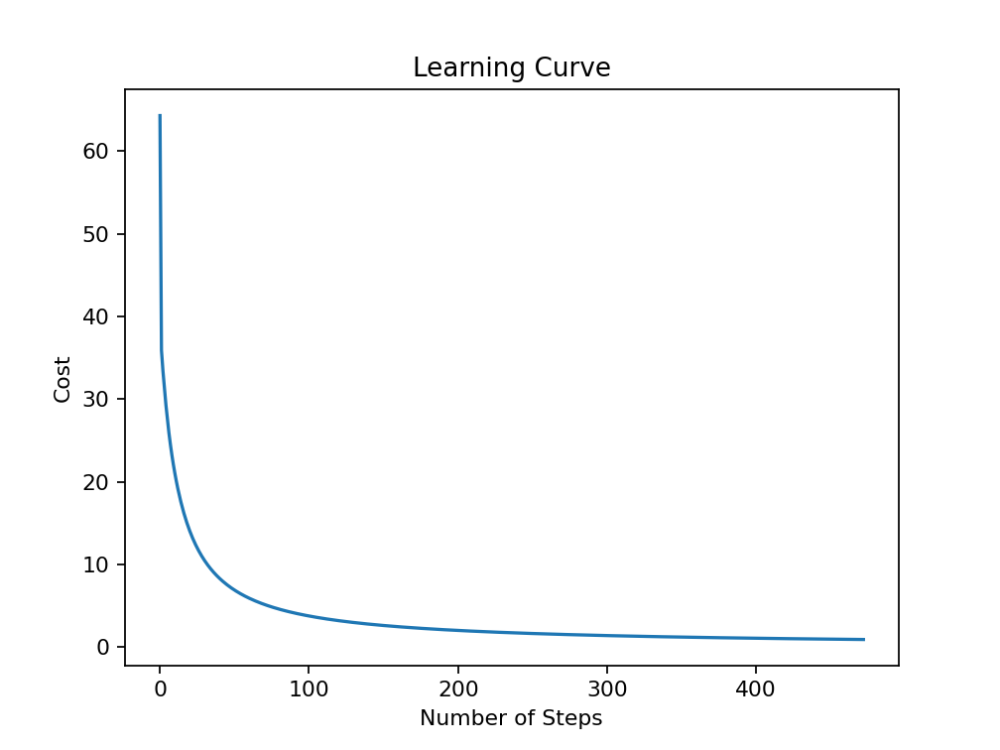

<IPython.core.display.Javascript object>


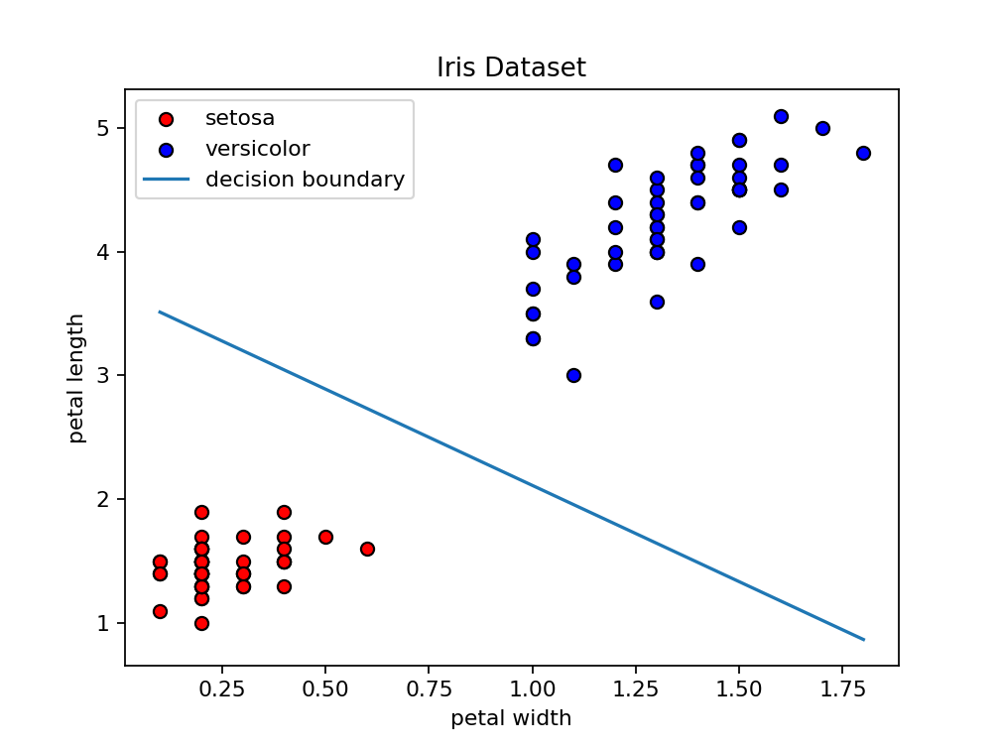

100.0

In [9]:
# TODO Task 5
#classification between setosa and versicolor classes
#select the petal width and length columns of the test points whose class is 0 or 1
two_classes = iris.data[iris.target[:]!=2,2:]
test_x = np.column_stack([two_classes[:,1],two_classes[:,0]]) #reorder so we have petal width first then petal length
ones = np.ones((len(test_x),1))
X = np.column_stack([ones, test_x]) #create design matrix
y = iris.target[iris.target[:]!=2] #exclude data points from the virginica class

theta_init = np.array([[0, 0.5, 1]])
alpha=0.01

#TODO - run an instance of the model and plot the learning curve
iris_classification = LogisticRegression(X, y, theta_init, alpha)
iris_classification.learning_curve(iris_classification.run_gradient_descent())
iris_classification.decision_boundary('iris')
iris_classification.evaluate(X, y)

**Task 6**
Explore your method on the wine dataset, expanding from 2 dimensions into multiple dimensions.
 - Split the wine dataset into a training set and a test set (80/20 split). We recommend shuffling the data first.
 - Then, perform feature scaling (standardizing to mean = 0 and variance = 1) on both the training and test sets. Please write your own function to perform this standardization, rather than using a module from scikit-learn. Note that it is recommended to calculate the scaling parameters (mean and variance) from the training set, and then apply those same paramters to scale the test set, so that the test set does not influence the training in any way. 
 - **we are not expecting to get 100% accuracy on any of the feature combinations**, but an empirical lower bound for the accuracy is given. That is to say, your approach is probably right, as long as your performance on the test set is higher than the number.
 - Train your model on the wine training data with the following 4 [feature combinations] : percentage to beat during test
   * [fixed acidity, volatile acidity, residual sugar] : 85%
   * [density, pH, alcohol] : 75%
   * [fixed acidity, volatile acidity, chlorides] : 85%
   * [all 11 features]: 95%
   * note that the features list is: fixed acidity/volatile acidity/citric acid/residual sugar /chlorides/free sulfur dioxide/total sulfur dioxide/density/pH/sulphates/alcohol
 - Display the decision boundary plots (plot in 2d, so please just choose any 2 of your features as x- and y-). 
 - Display plots of the learning curve 
 - Report the model's final accuracy on the test set

In [10]:
#TODO - Task 6, apply your method to the wine dataset
#split into training and testing sets
np.random.shuffle(wine_data[1:,:]) #shuffle data
wine_features = wine_data[1:,:-1].astype(float) #get features
wine_targets = wine_data[1:,11].astype(float) #get targets
split_ind = int(len(wine_features)*0.8) #get the 80th percentile index

#get training and testing sets
train_x = np.array(wine_features[:split_ind])
train_y = np.array(wine_targets[:split_ind])
test_x = np.array(wine_features[split_ind:])
test_y = np.array(wine_targets[split_ind:])

In [11]:
'''
Feature scaling function that standardizes each features mean to 0 and variance to 1. 
@param x (numpy.ndarray) - feature dataset 
@return scaled_x (np.ndarray)
        mean (numpy.ndarray) - mean values of each feature in x
        std (numpy.ndarray) - standard deviation values of each feature in x
'''
def scale(x):
    #calculate mean and standard deviation if none is provided
    mean = np.mean(x, axis=0)
    std = np.std(x, axis=0)
    
    scaled_x = (x-mean)/std #scale to mean=0, variance=1
    
    return scaled_x, mean, std

In [12]:
#feature scaling
scaled_train_x, train_x_mean, train_x_std = scale(train_x)
scaled_test_x = (test_x-train_x_mean)/train_x_std

<IPython.core.display.Javascript object>


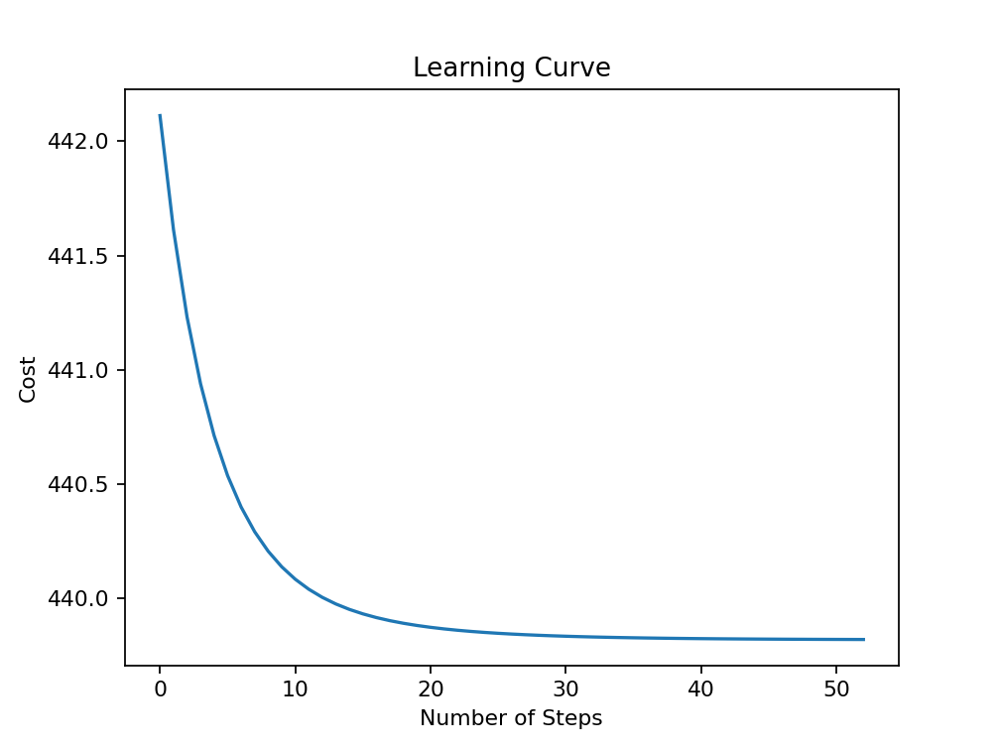

<IPython.core.display.Javascript object>


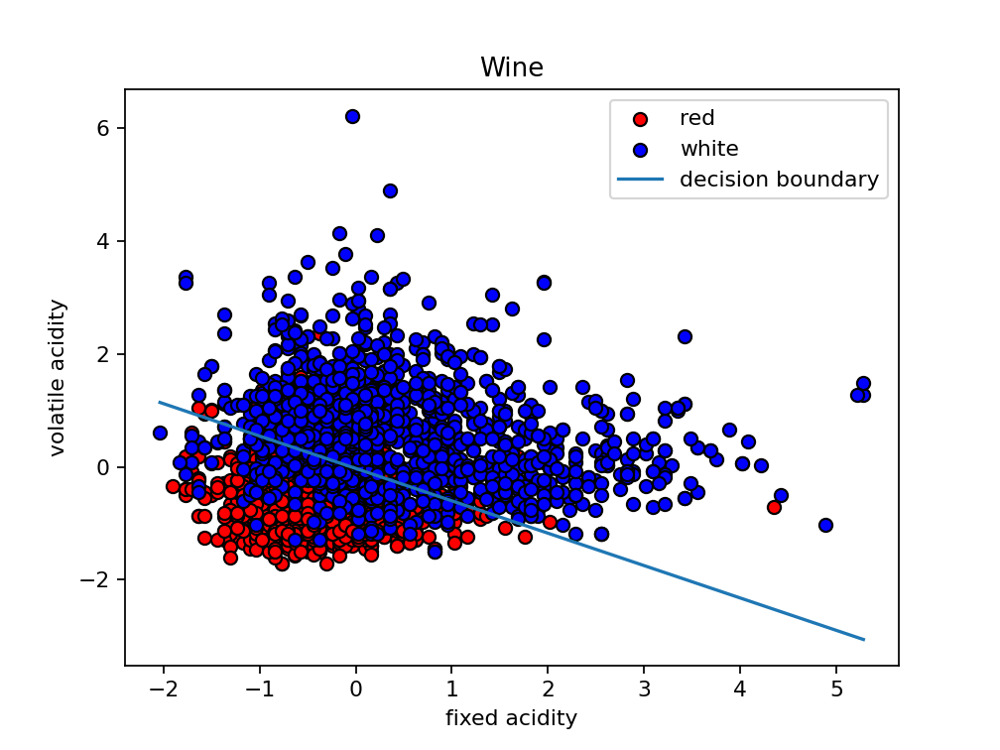

training set accuracy = 90.66041422430636 %
test set accuracy = 90.15625 %


In [13]:
#wine classification
#set 1 features = fixed acidity, volatile acidity, residual sugar
train_set_1 = np.column_stack([scaled_train_x[:,0], scaled_train_x[:,1], scaled_train_x[:,3]])
test_set_1 = np.column_stack([np.ones((len(test_x),1)), scaled_test_x[:,0], scaled_test_x[:,1], scaled_test_x[:,3]])
ones = np.ones((len(train_x),1))
X_1 = np.column_stack([ones, train_set_1]) #create design matrix
y_1 = train_y

theta_1 = np.array([[0, 1.5, 3, -2]])
alpha_1 = 0.001

#TODO - run an instance of the model and plot the learning curve
wine_1 = LogisticRegression(X_1, y_1, theta_1, alpha_1)
wine_1.learning_curve(wine_1.run_gradient_descent())
wine_1.decision_boundary('wine', xlab='fixed acidity', ylab='volatile acidity')

print('training set accuracy =', wine_1.evaluate(X_1, y_1), '%')
print('test set accuracy =', wine_1.evaluate(test_set_1, test_y), '%')

<IPython.core.display.Javascript object>


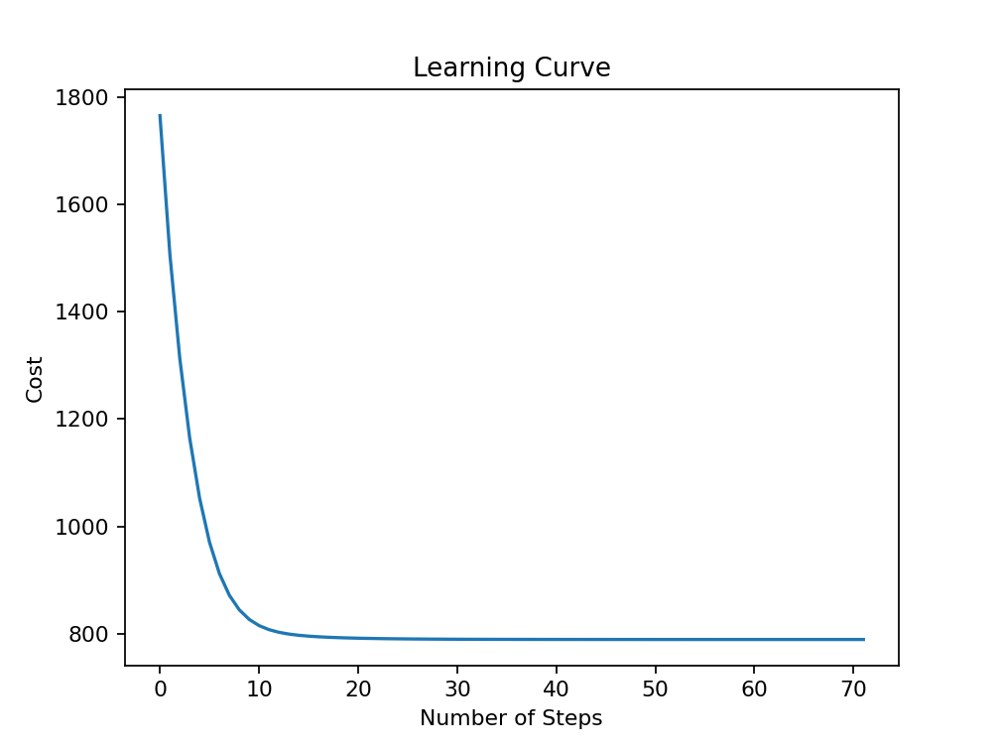

<IPython.core.display.Javascript object>


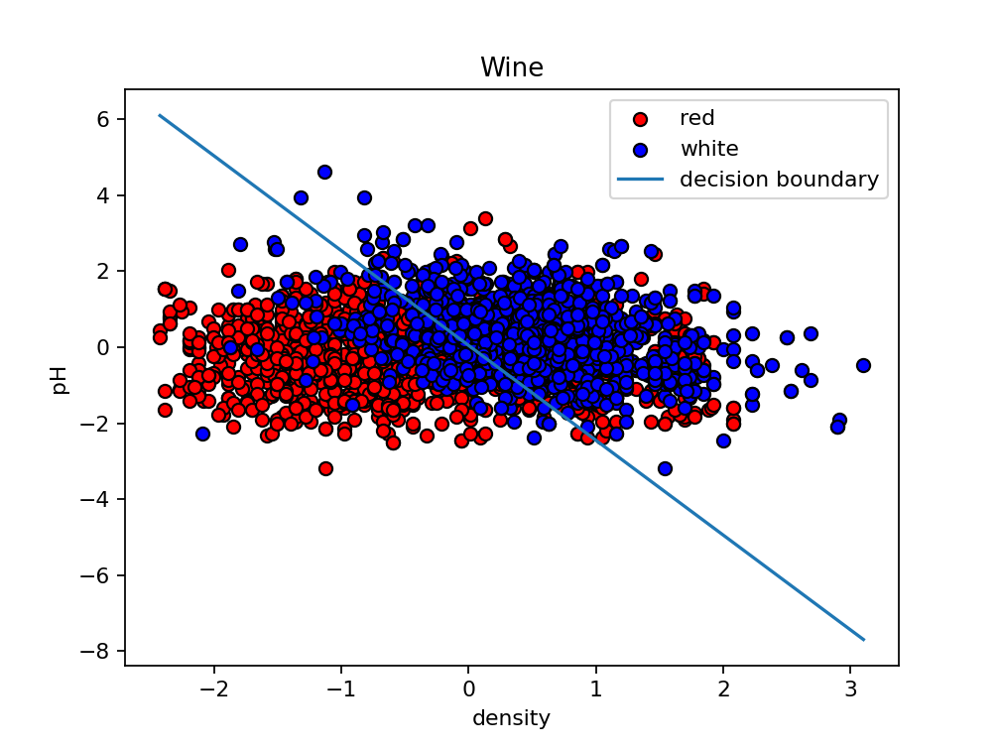

training set accuracy = 80.03126221180149 %
test set accuracy = 80.3125 %


In [14]:
#wine classification
#set 2 features = density, pH, alcohol
train_set_2 = np.column_stack([scaled_train_x[:,7], scaled_train_x[:,8], scaled_train_x[:,10]])
test_set_2 = np.column_stack([np.ones((len(test_x),1)), scaled_test_x[:,7], scaled_test_x[:,8], scaled_test_x[:,10]])
ones = np.ones((len(train_x),1))
X_2 = np.column_stack([ones, train_set_2]) #create design matrix
y_2 = train_y

theta_2 = np.array([[0, 1.5, 3, -2]])
alpha_2 = 0.001

#TODO - run an instance of the model and plot the learning curve
wine_2 = LogisticRegression(X_2, y_2, theta_2, alpha_2)
wine_2.learning_curve(wine_2.run_gradient_descent())
wine_2.decision_boundary('wine', xlab='density', ylab='pH')

print('training set accuracy =', wine_2.evaluate(X_2, y_2), '%')
print('test set accuracy =', wine_2.evaluate(test_set_2, test_y), '%')

<IPython.core.display.Javascript object>


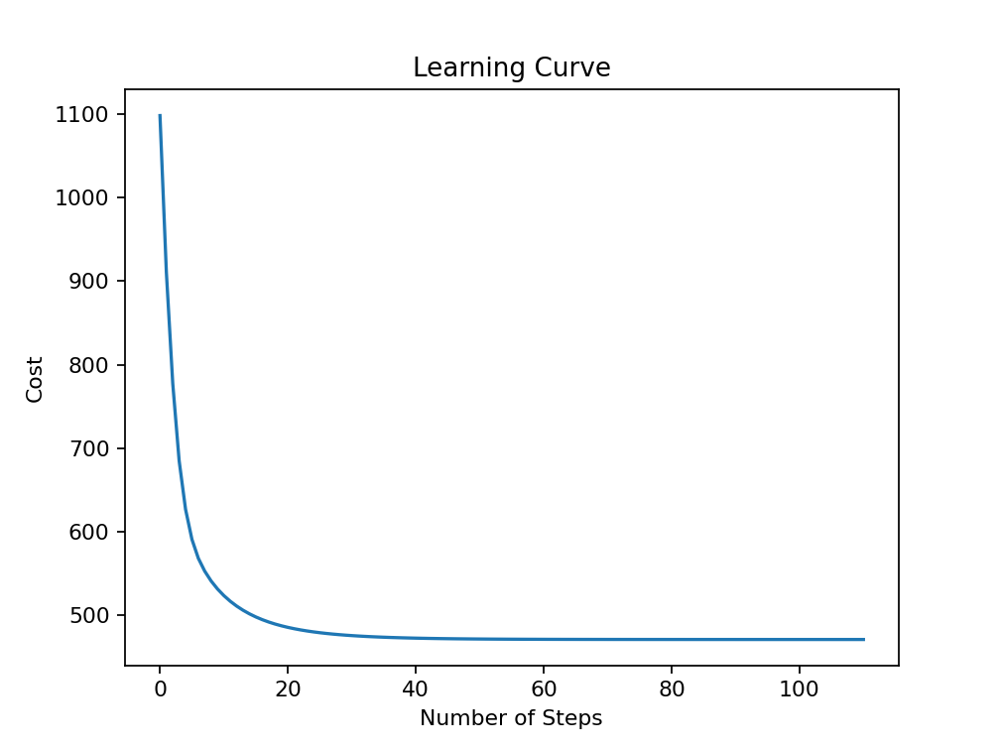

<IPython.core.display.Javascript object>


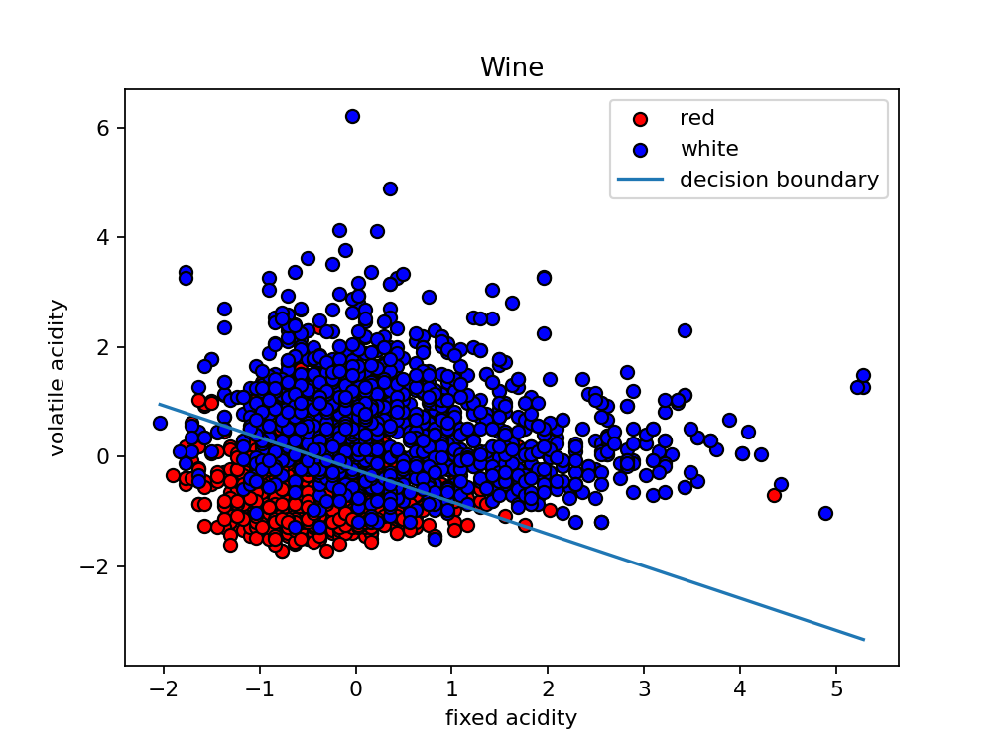

training set accuracy = 91.28565846033607 %
test set accuracy = 92.1875 %


In [15]:
#wine classification
#set 3 features = fixed acidity, volatile acidity, chlorides
train_set_3 = np.column_stack([scaled_train_x[:,0], scaled_train_x[:,1], scaled_train_x[:,4]])
test_set_3 = np.column_stack([np.ones((len(test_x),1)), scaled_test_x[:,0], scaled_test_x[:,1], scaled_test_x[:,4]])
ones = np.ones((len(train_x),1))
X_3 = np.column_stack([ones, train_set_3]) #create design matrix
y_3 = train_y

theta_3 = np.array([[0, 1.5, 3, -2]])
alpha_3 = 0.001

#TODO - run an instance of the model and plot the learning curve
wine_3 = LogisticRegression(X_3, y_3, theta_3, alpha_3)
wine_3.learning_curve(wine_3.run_gradient_descent())
wine_3.decision_boundary('wine', xlab='fixed acidity', ylab='volatile acidity')

print('training set accuracy =', wine_3.evaluate(X_3, y_3), '%')
print('test set accuracy =', wine_3.evaluate(test_set_3, test_y), '%')

<IPython.core.display.Javascript object>


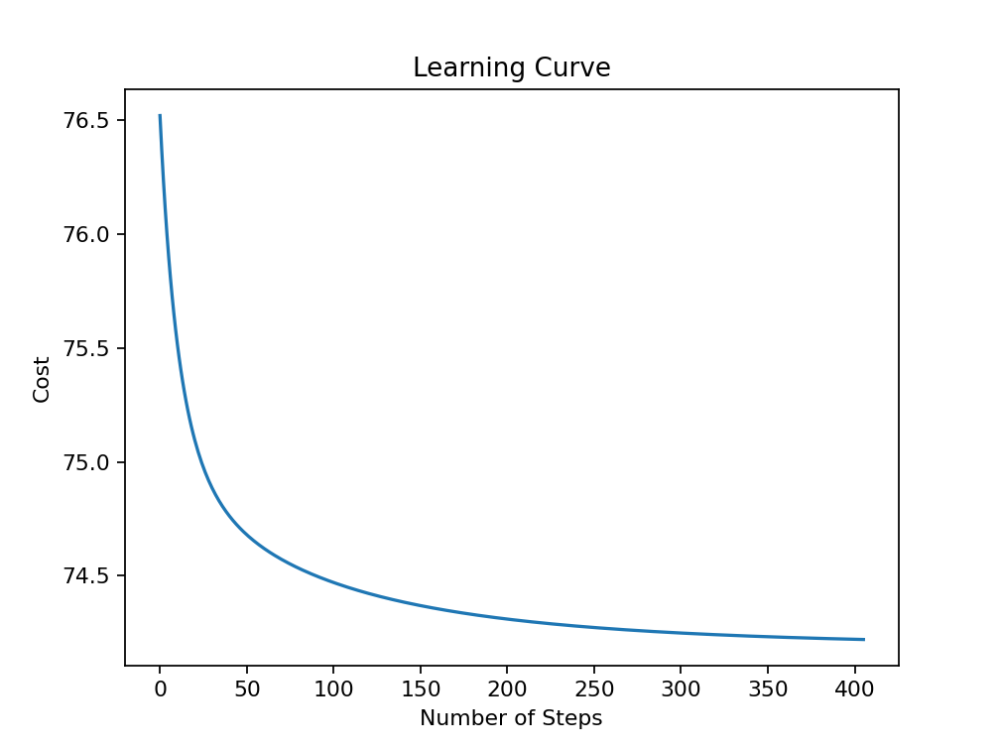

<IPython.core.display.Javascript object>


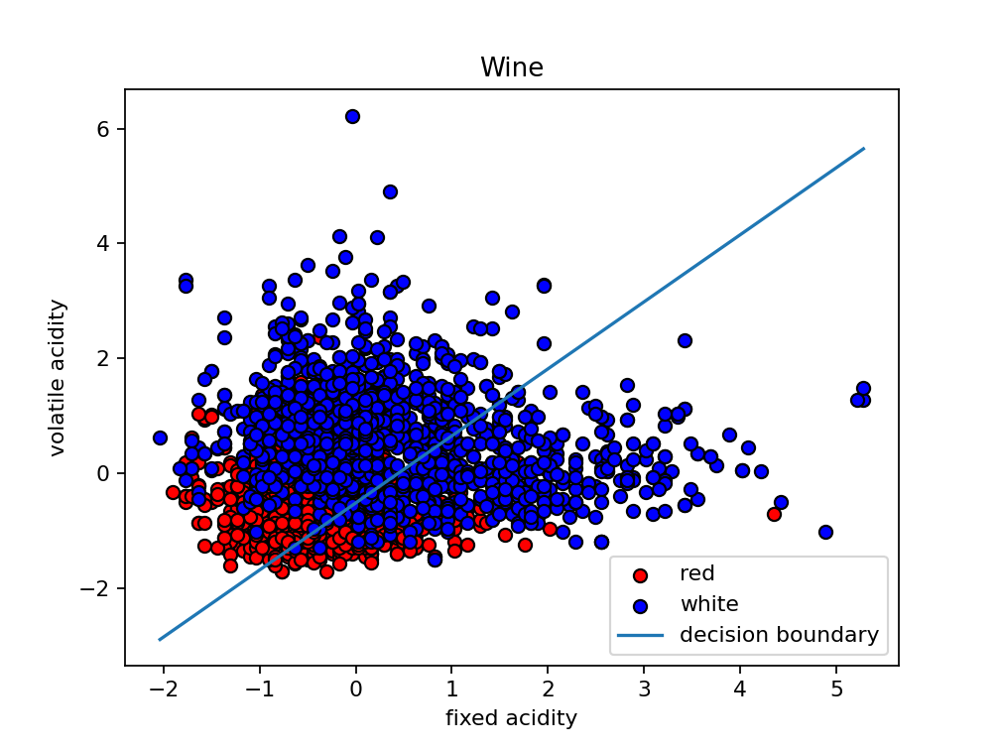

training set accuracy = 99.25752246971473 %
test set accuracy = 99.0625 %


In [16]:
#wine classification
#set 4 features = all features
train_set_4 = scaled_train_x
test_set_4 = np.column_stack([np.ones((len(test_x),1)), scaled_test_x])
ones = np.ones((len(train_x),1))
X_4 = np.column_stack([ones, train_set_4]) #create design matrix
y_4 = train_y

theta_4 = np.array([[1, -2, 1.5, -0.5, -4, 0.75, 1.5, -3.5, 7.5, -1.5, 0, 4]])
alpha_4 = 0.001

#TODO - run an instance of the model and plot the learning curve
wine_4 = LogisticRegression(X_4, y_4, theta_4, alpha_4)
wine_4.learning_curve(wine_4.run_gradient_descent())
wine_4.decision_boundary('wine', xlab='fixed acidity', ylab='volatile acidity')

print('training set accuracy =', wine_4.evaluate(X_4, y_4), '%')
print('test set accuracy =', wine_4.evaluate(test_set_4, test_y), '%')

**Question 3:**

 3.1. Describe the convergence condition you selected.

Response: My model is considered to be converged when the norm of the gradient vector of the cost function is less than 0.5. Just like in the first assignment, the gradient of the cost function measures the rate of change of the cost function at a given point, and the cost function is minimized when the gradient of the cost function equals zero. The norm is taken to compress multi-dimensional gradient vectors down into a scalar value, but the same principle applies such that the cost is minimized when the norm of the gradient of the cost function equals zero. Here, I used a higher threshold (0.05) than in the first assignment to speed up the runtime after noticing that the updated theta parameters were not greatly changing once this threshold was met and that the model was making accurate classifications. 

 3.2. What was the model's training accuracy on the Iris dataset (for the two classes you selected)?

Response: The training accuracy for the iris dataset was 100% for classifying setosa and versicolor species. This was expected because the dataset is linearly separable using the petal length and petal width features. 

 3.3. What was the model's training and test accuracy on the wine quality dataset? Which one gives the best performance? Does that live up to your expectation and why?

Response: The first model trained using the fixed acidity, volatile acidity, and residual sugar features had a training accuarcy of 90.1% and a test accuracy of 90.2%. The second model trained using the density, pH, and alcohol features had a training accuarcy of 80.0% and a test accuracy of 80.3%. The third model trained using the fixed acidity, volatile acidity, and chlorides features had a training accuarcy of 91.3% and a test accuracy of 92.2%. The final model trained using all 11 features had a training accuarcy of 99.3% and a test accuracy of 99.1%.
The model that was trained using all 11 features most accurately classified both the training and test sets. This makes sense because additional features where the wine classes differ slightly are included in training, and the combination of subtle differences between classes learned by the model will improve classification accuracy. I had assumed that more data would only help the classification accuracy. However, the addition of too many features in the dataset will require more computational power and slow down the training process, which is why it can be beneficial to select a subset of features to classify based on. Here, we saw that using only the fixed acidity, volatile acidity, and chlorides features for training will still yield a pretty accurate model (>90% accurate).

---
## Part 2: Locally Weighted Linear Regression 

In this second part, you will write a locally weighted linear regression class, and apply it to a synthetic dataset. This dataset is included as a text file on Brightspace, and is called 'LWR_samples.npy'. Each line of the text file represents one training example in the format $x^{(i)},y^{(i)}$ (i.e. the delimiter is a comma). 

#### **Task 7**
- Load the synthetic data, from the file `assignment2_LWR_samples.npy`
- Interpret the $(x^{(i)},y^{(i)})$ pairs, and plot them with a scatter plot.
- Implement a LocallyWeightedLR class (example framework below). To make a prediction at input $x$, weight each training example according to the function we discussed in lecture: 
$$ w^{(i)} = \exp\big(-\frac{(x^{(i)} - x)^2}{2\tau^2} \big), $$
where $\tau$ is a bandwidth parameter that you will experiment with.
- To compute the local linear regression parameters ($\theta$) at each query point, use the closed-form solution. The formula is:
$$ \theta = (X^TWX)^{-1} X^TWy, $$
where $X$ is the design matrix formed by your training inputs (make sure to include the intercept term), $W$ is a diagonal matrix whose $i^{th}$ diagonal entry corresponds to the weight of the $i^{th}$ training example (which depend on the point at which you are making a prediction), and $y$ is a column vector containing the target labels of the training examples.

- Run this regression model to make predictions at the specific input points x = 4, x = 0.5, and x = -3. Use $\tau$ = 0.5. Report the values of the local regression parameters $\theta$ obtained for each of these 3 points.
- Now, generate an array of predictions corresponding to equally spaced input points (in the range of [-4.5, 4.5] in steps of 0.05), again using $\tau$ = 0.5. Generate a plot showing the predictions from Locally Weighted Linear Regression on each of these input points, superimposed on (and colored differently from) the training data.
- Repeat the previous step, now using bandwidth parameters $\tau = 0.1$ and $\tau = 1.5$. Plot the results, again superimposed on the training data (and in a different color).

In [17]:
#TODO - Implement Locally-Weighted Linear Regression class

class LocallyWeightedLR():
    
    '''
    Implementation of locally weighted linear regression 
    @param X (numpy.ndarray) - design matrix of input features
           y (numpy.ndarray) - corresponding targets
           tau (float) - smoothing value
           x (float) - target point
    '''
    def __init__(self, X, y, tau, x):
        self.X = X
        self.y = y
        self.tau = tau 
        self.x = x
    
    '''
    Compute weights of training points. 
    @return W (np.ndarray) - diagonal weight matrix 
    '''
    def compute_weights(self):
        W = np.zeros((len(self.X), len(self.X))) #initialize diagonal weight matrix
        for i in range(len(self.X)): #fill in the weights
            W[i,i] = np.exp(-(self.X[i,1]-self.x)**2/(2*(self.tau**2)))
        return W
    
    '''
    Compute local linear regression parameters at the target point
    @return theta values (np.ndarray)
    '''
    def compute_theta(self):
        W = self.compute_weights() #create the diagonal weight matrix
        return np.linalg.inv(self.X.T.dot(W).dot(self.X)).dot(self.X.T).dot(W).dot(self.y)
    
    '''
    Predict the target value for an input x
    @return prediction (float)
            theta (np.ndarray) - linear regression parameters
    '''
    def predict(self):
        theta = self.compute_theta() #compute theta
        pred = theta[0] + theta[1]*self.x #make prediction
        return pred, theta

<IPython.core.display.Javascript object>


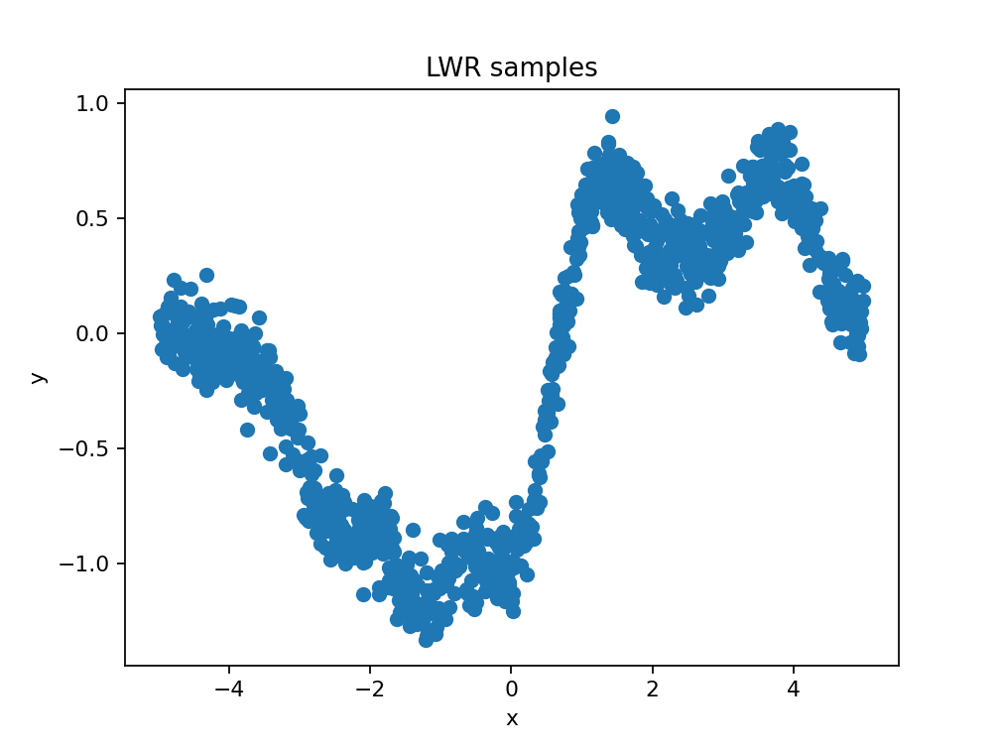

In [18]:
#TODO - Read in the artificial dataset, plot it, and run the code according to the above instructions.
#load artificial dataset
data = np.load('assignment2-LWR_samples.npy')

x = data[:,0]
y = data[:,1]
#create design matrix
X = np.column_stack([np.ones((len(x),1)), x]) 

#plot x, y pairs
plt.figure()
plt.scatter(x, y)
plt.xlabel('x')
plt.ylabel('y')
plt.title("LWR samples") 
plt.show()

In [19]:
#target point = 4
run1 = LocallyWeightedLR(X, y, tau=0.5, x=4)
pred_y, theta_1 = run1.predict()
print('target point = 4')
print('prediction:', pred_y)
print('theta:', theta_1, '\n')

#target point = 0.5
run2 = LocallyWeightedLR(X, y, tau=0.5, x=0.5)
pred_y, theta_2 = run2.predict()
print('target point = 0.5')
print('prediction:', pred_y)
print('theta:', theta_2, '\n')

#target point = -3 
run3 = LocallyWeightedLR(X, y, tau=0.5, x=-3)
pred_y, theta_3 = run3.predict()
print('target point = -3')
print('prediction:', pred_y)
print('theta:', theta_3, '\n')

target point = 4
prediction: 0.5051790815889359
theta: [ 1.78634424 -0.32029129] 

target point = 0.5
prediction: -0.2867276522997305
theta: [-0.84244208  1.11142885] 

target point = -3
prediction: -0.5191300767604878
theta: [-2.08390745 -0.52159246] 



<IPython.core.display.Javascript object>


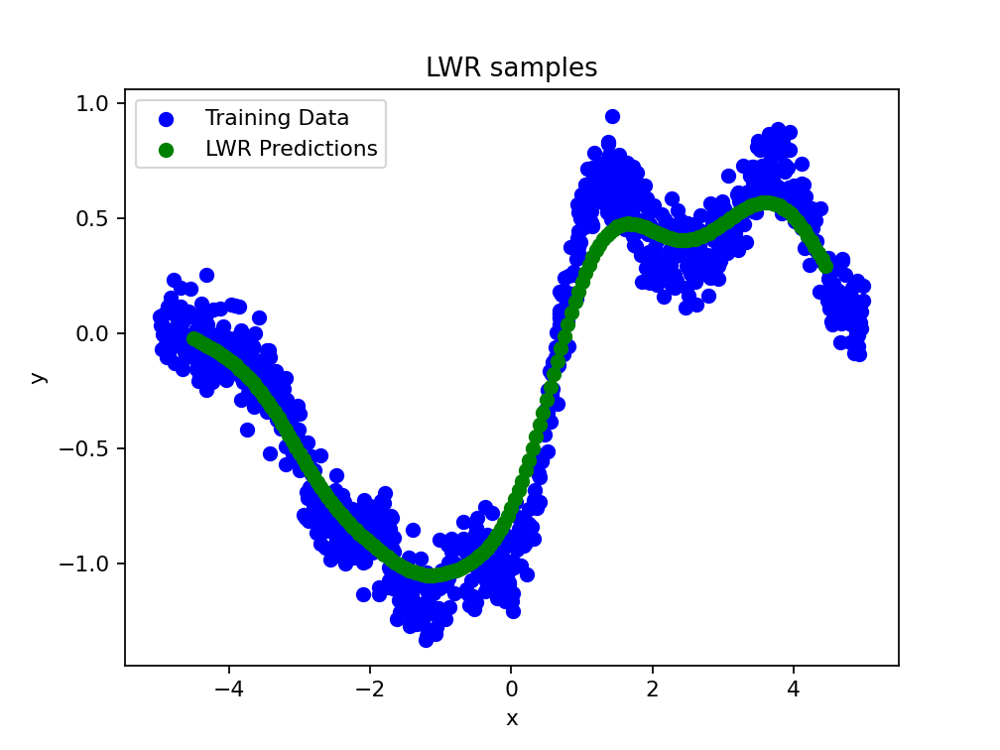

In [20]:
target_lst = np.arange(-4.5, 4.5, 0.05)
pred_lst = []
for i in target_lst:
    model = LocallyWeightedLR(X, y, tau=0.5, x=i)
    pred_y, theta_3 = model.predict()
    pred_lst.append(pred_y)

#plot
plt.figure()
plt.scatter(x, y, color='blue', label='Training Data')
plt.scatter(target_lst, pred_lst, color='green', label='LWR Predictions')
plt.legend()
plt.xlabel('x')
plt.ylabel('y')
plt.title("LWR samples") 
plt.show()

target point = 4
prediction: 0.6234149068739545
theta: [ 3.11266693 -0.62231301] 

target point = 0.5
prediction: -0.36964742426459174
theta: [-1.41550184  2.09170883] 

target point = -3
prediction: -0.517226473829048
theta: [-3.59887216 -1.02721523] 



<IPython.core.display.Javascript object>


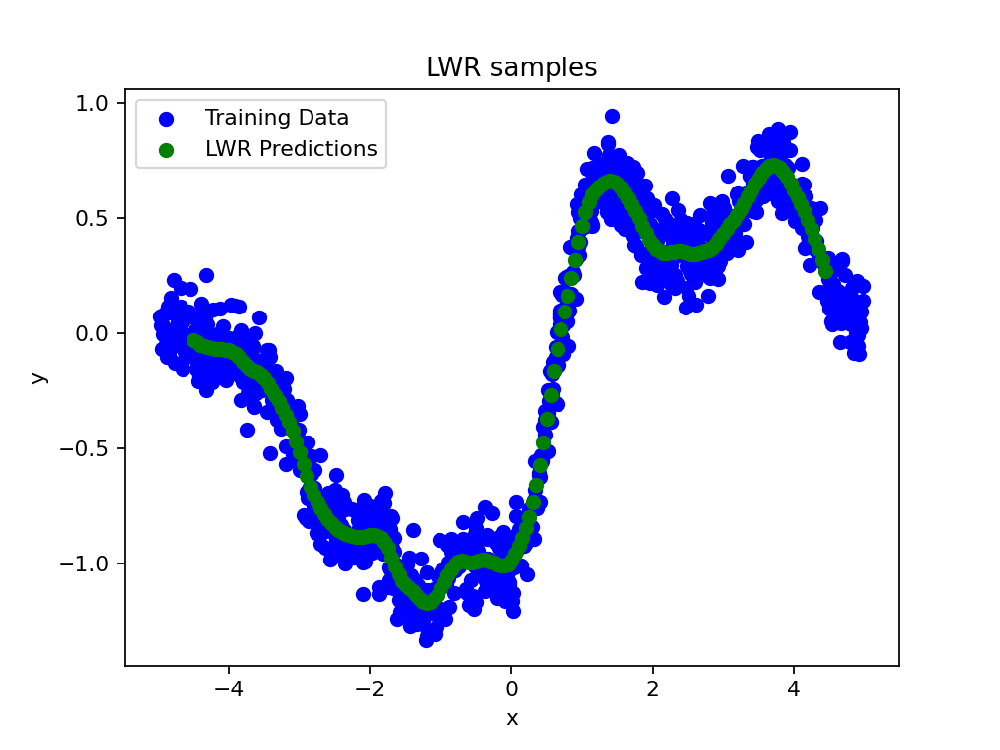

In [21]:
#Repeat above steps with tau=0.1
#target point = 4
run1 = LocallyWeightedLR(X, y, tau=0.1, x=4)
pred_y, theta_1 = run1.predict()
print('target point = 4')
print('prediction:', pred_y)
print('theta:', theta_1, '\n')

#target point = 0.5
run2 = LocallyWeightedLR(X, y, tau=0.1, x=0.5)
pred_y, theta_2 = run2.predict()
print('target point = 0.5')
print('prediction:', pred_y)
print('theta:', theta_2, '\n')

#target point = -3 
run3 = LocallyWeightedLR(X, y, tau=0.1, x=-3)
pred_y, theta_3 = run3.predict()
print('target point = -3')
print('prediction:', pred_y)
print('theta:', theta_3, '\n')

#lots of points
target_lst = np.arange(-4.5, 4.5, 0.05)
pred_lst = []
for i in target_lst:
    model = LocallyWeightedLR(X, y, tau=0.1, x=i)
    pred_y, theta_3 = model.predict()
    pred_lst.append(pred_y)

#plot
plt.figure()
plt.scatter(x, y, color='blue', label='Training Data')
plt.scatter(target_lst, pred_lst, color='green', label='LWR Predictions')
plt.legend()
plt.xlabel('x')
plt.ylabel('y')
plt.title("LWR samples") 
plt.show()

target point = 4
prediction: 0.4189217248580776
theta: [ 0.42082471 -0.00047575] 

target point = 0.5
prediction: -0.2388280565935521
theta: [-0.42592116  0.3741862 ] 

target point = -3
prediction: -0.4862129943295602
theta: [-1.24045183 -0.25141295] 



<IPython.core.display.Javascript object>


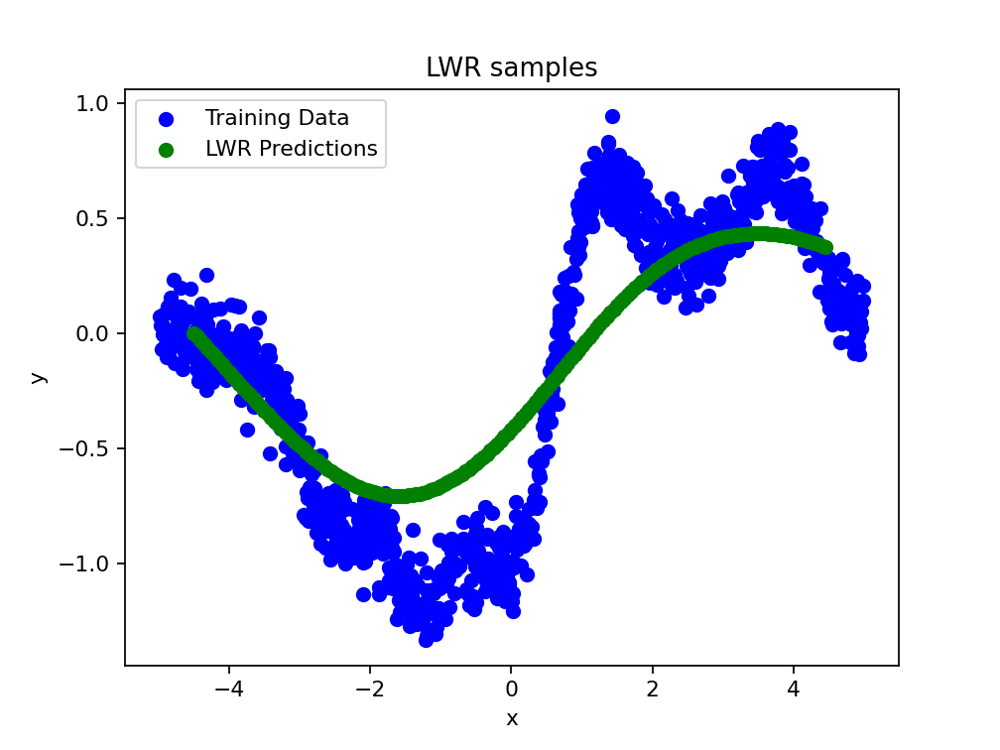

In [22]:
#Repeat above steps with tau=1.5
#target point = 4
run1 = LocallyWeightedLR(X, y, tau=1.5, x=4)
pred_y, theta_1 = run1.predict()
print('target point = 4')
print('prediction:', pred_y)
print('theta:', theta_1, '\n')

#target point = 0.5
run2 = LocallyWeightedLR(X, y, tau=1.5, x=0.5)
pred_y, theta_2 = run2.predict()
print('target point = 0.5')
print('prediction:', pred_y)
print('theta:', theta_2, '\n')

#target point = -3 
run3 = LocallyWeightedLR(X, y, tau=1.5, x=-3)
pred_y, theta_3 = run3.predict()
print('target point = -3')
print('prediction:', pred_y)
print('theta:', theta_3, '\n')

#lots of points
target_lst = np.arange(-4.5, 4.5, 0.05)
pred_lst = []
for i in target_lst:
    model = LocallyWeightedLR(X, y, tau=1.5, x=i)
    pred_y, theta_3 = model.predict()
    pred_lst.append(pred_y)

#plot
plt.figure()
plt.scatter(x, y, color='blue', label='Training Data')
plt.scatter(target_lst, pred_lst, color='green', label='LWR Predictions')
plt.legend()
plt.xlabel('x')
plt.ylabel('y')
plt.title("LWR samples") 
plt.show()

**Question 4**: 
 - Do the local linear regression parameters $\theta$ returned for the 3 input points (4, 0.5, -3) agree with what you expect, based on the training data in the neighborhood of those points? Why or why not?

Response: Each of the three input points resulted in very different optimized theta values that corresponded with a predicted y value (0.5, -0.29, and -2.08, respectively) that was similar to the y values of similar x values in the training set, which was expected. This shows that the locally weighted regression function was correctly weighting and therefore emphasizing x values near the target point during prediction.


**Question 5:**  
 - Based on your observations, describe the effect of increasing and decreasing $\tau$, in the context of over/underfitting.
 
Response: It is clear that changing tau greatly changes the predicted result using locally weighted regression. Decreasing tau to 0.1 corresponded with overfitting. This model was very specific to the training data, especially in the range of x values between -2.5 and 0. On the other hand, increasing tau to 1.5 generated too smooth of a function that was underfitted and less accurate in predicting y values.

---
## Part 3: Submission 

Please upload a clean version of your work to Brightspace by the deadline.

Below, please acknowledge your collaborators as well as any resources/references (beyond guides to Python syntax) that you have used in this assignment: